# Advanced Data Analysis

This notebook is dedicated to further visualize the data using PCA and t-SNE. The aim is to identify possible outliers, as well as understanding better the shape of the data

### IMPORTANT:

In order to visualize plotly's plots in jupyter, you need to have nodejs installed, as well as the correct extension for jupyter lab. For more info follow https://ipywidgets.readthedocs.io/en/latest/user_install.html on how to install all the required packages.

In [1]:
#For development
#Reload the library when a change is detected in one of the imported libraries
%load_ext autoreload 
%autoreload 2

In [2]:
import pandas as pd
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [3]:
#Custom utils file
from src import advanced_analysis as aa

In [4]:
df = pd.read_csv("data/Train_gold.csv")

In [5]:
target = "Flow_label"
s_target = pd.read_csv("data/Train_bronze.csv")[target] 
features = df.columns.drop(target)

X, y = df[features].values, df[target].values.ravel()

## Principal Component Analysis

Principal Component Analysis can be used to summarize the data by projecting the features in a subspace that maximize the variance kept. Note that due to the fact that the features have widely different scales, we first need to standardize the data.

In [6]:
pca = PCA()
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X)
X_pca = pca.fit_transform(X_scaled)

explained = pca.explained_variance_ratio_
pc = [x for x in range(len(explained))]

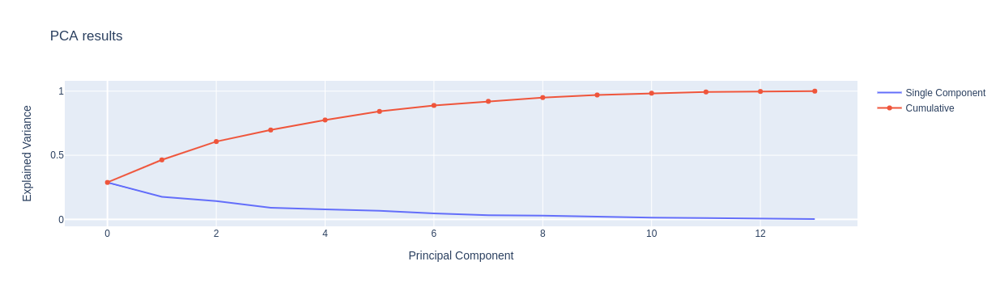

In [7]:
aa.plot_explained_variance(pc, explained)

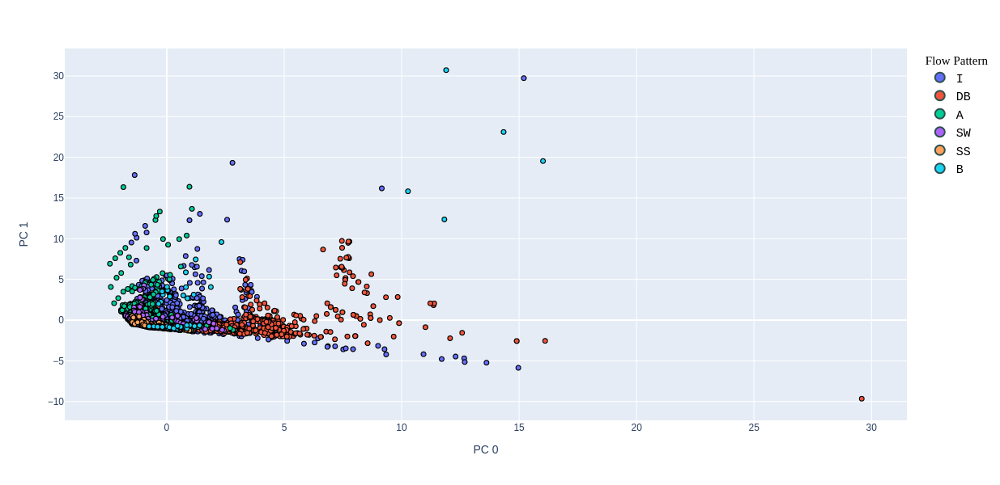

In [8]:
df_pca = pd.DataFrame({f"PC {component}": X_pca[:, component] for component in pc})
df_pca["Flow Pattern"] = s_target 
df_pca["Index"] = df_pca.index
aa.plot_pca(df_pca, (0,1))

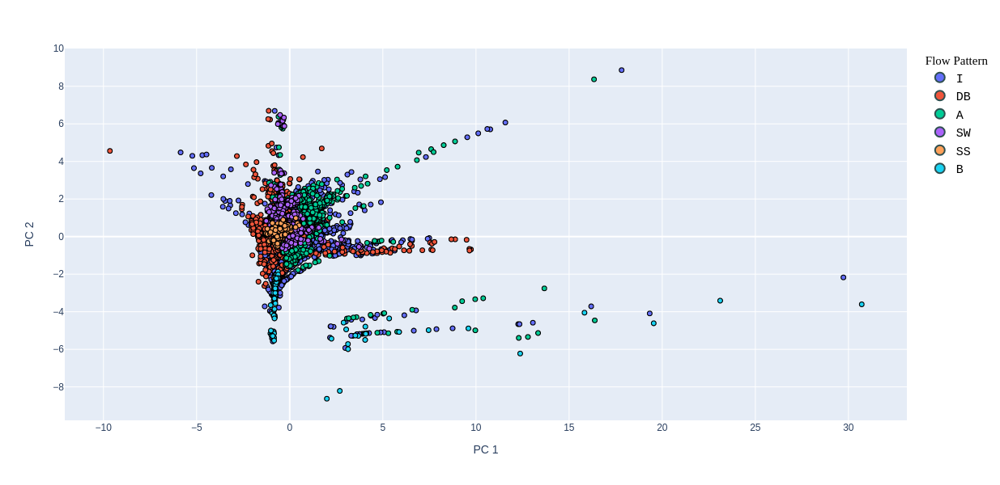

In [9]:
aa.plot_pca(df_pca, (1,2))

## t-SNE

We can use t-SNE to reduce the dimensionality of the data while preserving the relative euclidean distance between the various points. This will help to understant the relative position of the classes. For example, the Intermittent flow regime is known to be a common flow pattern, that will develop under a wide range of working conditions. t-SNE can help confirm this hypothesis by showing that said flow regime is at the center of the plot, confining with the other flow patterns

In [10]:
aa.plot_tsne(X_scaled, s_target, 3)

In [11]:
aa.plot_tsne(X_scaled, s_target, 2)

## Paracords Plot

The last tool that can be usefull in this advanced analysis is to plot the paracords graph, which can help to visualize the interaction between variables of interest in determining the flow regime. It can also be used to understand where more data would be needed to achieve better generalization. In particular, is is known that the dispersed bubbly regime can exist even in micro pipes (with low Eo), but the dataset at hand does not have data about this possibility, meaning that it is lacking in that regard. More data to cover micro pipes would most likely improve the model.

In [12]:
aa.plot_paracords(df)